In [ ]:
import torch
import numpy as np
from transformers import SegformerForImageClassification, SegformerFeatureExtractor
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import os

In [ ]:
# Проверка доступности GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Используемое устройство: {device}")

Используемое устройство: cuda


In [ ]:
! pip install wldhx.yadisk-direct

In [ ]:
!curl -L $(yadisk-direct https://disk.yandex.com/d/jJrOLbYlBYVESQ) -o lyft_segmentation.zip
! unzip -qq lyft_segmentation.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
100 2620M  100 2620M    0     0  13.8M      0  0:03:09  0:03:09 --:--:-- 14.9M


In [ ]:
# import os
# import numpy as np
# from PIL import Image

# # Путь к папке с масками сегментации
# mask_dir = "/content/lyft_segmentation/segmentation_masks"  # Укажите правильный путь

# # Список файлов масок
# mask_files = os.listdir(mask_dir)

# # Функция для обработки и сохранения масок
# def process_and_save_mask(mask_path):
#     # Открываем маску
#     mask = Image.open(mask_path)

#     # Преобразуем маску в numpy-массив
#     mask = np.array(mask)

#     # Сохраняем обработанную маску
#     processed_mask = Image.fromarray(mask)
#     processed_mask.save(mask_path)  # Сохраняем в тот же путь, заменяя оригинал

# # Обрабатываем все маски в папке
# for mask_file in mask_files:
#     mask_path = os.path.join(mask_dir, mask_file)

#     # Пропускаем, если это не файл изображения
#     if not mask_file.endswith(('.png', '.jpg', '.jpeg')):
#         continue

#     process_and_save_mask(mask_path)

# print("Все маски обработаны и сохранены.")


KeyboardInterrupt: 

In [ ]:
# # Функция для обработки и сохранения масок
# def process_and_save_mask(mask_path):
#     # Открываем маску
#     mask = Image.open(mask_path)

#     # Преобразуем маску в numpy-массив
#     mask = np.array(mask)

#     # Сохраняем обработанную маску
#     processed_mask = Image.fromarray(mask)
#     processed_mask.save(mask_path)  # Сохраняем в тот же путь, заменяя оригинал
# mask_path = '/content/lyft_segmentation/segmentation_masks/02_00_003.png'
# process_and_save_mask(mask_path)

### Преобразование масок сегментации из rgb формата в чб для finetuning-а segformer

In [ ]:
!pip install torch torchvision transformers

In [ ]:
import os
from PIL import Image
from tqdm import tqdm  # Импортируем tqdm для прогресс-бара

# Путь к папке с масками
input_dir = "/content/lyft_segmentation/segmentation_masks"
output_dir = "/content/lyft_segmentation/segmentation_masks_processed"

# Создаем папку для сохранения преобразованных масок, если ее еще нет
os.makedirs(output_dir, exist_ok=True)

# Получаем список всех файлов в папке с масками
mask_files = [f for f in os.listdir(input_dir) if f.endswith(".png")]

# Проходим по всем файлам в папке с масками с прогресс-баром
for filename in tqdm(mask_files, desc="Processing masks", unit="mask"):
    mask_path = os.path.join(input_dir, filename)

    # Открываем изображение маски
    mask_image = np.array(Image.open(mask_path))
    mask_image =  mask_image[:, :, 0]

    mask_image = Image.fromarray(mask_image.astype(np.uint8))
    # Сохраняем преобразованное изображение в новую папку
    output_path = os.path.join(output_dir, filename)
    mask_image.save(output_path)

print("Все маски успешно преобразованы и сохранены.")


Processing masks: 100%|██████████| 5000/5000 [01:51<00:00, 44.82mask/s]

Все маски успешно преобразованы и сохранены.


### Создадим из наших изобрежений и масок датасет, однако из-за огранниченности ресурсов озу в colab получается обработать только 90%, после чего он перезагружается, поэтому удалим часть изображений и масок

In [ ]:
import os
import random
from tqdm import tqdm

# Путь к изображениям и маскам
image_dir = "/content/lyft_segmentation/images"
mask_dir = "/content/lyft_segmentation/segmentation_masks_processed"

# Список файлов изображений и масок
image_files = sorted(os.listdir(image_dir))
mask_files = sorted(os.listdir(mask_dir))

# Вычисляем количество файлов для удаления (20%)
num_files_to_remove = int(0.95 * len(image_files))

# Выбираем случайные индексы для удаления
files_to_remove = random.sample(range(len(image_files)), num_files_to_remove)

# Удаляем соответствующие файлы
for idx in tqdm(files_to_remove, desc="Удаление файлов"):
    image_file = image_files[idx]
    mask_file = mask_files[idx]

    # Путь к файлам
    image_path = os.path.join(image_dir, image_file)
    mask_path = os.path.join(mask_dir, mask_file)

    # Удаляем файлы
    os.remove(image_path)
    os.remove(mask_path)

print(f"Удалено {num_files_to_remove} изображений и масок.")

Удаление файлов: 100%|██████████| 4750/4750 [00:00<00:00, 6731.38it/s]

Удалено 4750 изображений и масок.


In [ ]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 17.8 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
from datasets import Dataset, DatasetDict
from PIL import Image
import numpy as np
import os
from tqdm import tqdm

# Путь к изображениям и маскам
image_dir = "/content/lyft_segmentation/images"
mask_dir = "/content/lyft_segmentation/segmentation_masks_processed"

# Список файлов изображений и масок
image_files = sorted(os.listdir(image_dir))
mask_files = sorted(os.listdir(mask_dir))

# Преобразование изображений и масок в формат, пригодный для обучения
def load_image_and_mask(image_file, mask_file):
    image_path = os.path.join(image_dir, image_file)
    mask_path = os.path.join(mask_dir, mask_file)

    # Загружаем изображение
    image = Image.open(image_path).convert("RGB")

    # Загружаем маску
    mask = Image.open(mask_path)#.convert("L")  # 'L' — черно-белый формат

    # Преобразуем маску в numpy array и нормализуем
    mask = np.array(mask)

    return {"image": image, "mask": mask}

# Создаем список для датасета с прогресс-баром
data = []
for image_file, mask_file in tqdm(zip(image_files, mask_files), total=len(image_files), desc="Загрузка данных"):
    data.append(load_image_and_mask(image_file, mask_file))

# Применение прогресс-бара при создании словаря для датасета
images = [d["image"] for d in tqdm(data, desc="Подготовка изображений для датасета")]
masks = [d["mask"] for d in tqdm(data, desc="Подготовка масок для датасета")]

# Создаем Dataset с прогресс-баром
dataset = Dataset.from_dict({"pixel_values": images, "labels": masks})
# Разделяем на обучающий и тестовый наборы (80/20)
dataset = dataset.train_test_split(test_size=0.2, seed=42)
train_ds = dataset["train"]
test_ds = dataset["test"]

# Печатаем пример
print(train_ds[0])

Подготовка масок для датасета: 100%|██████████| 250/250 [00:00<00:00, 944663.06it/s]


{'pixel_values': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=800x600 at 0x7AFC3C904520>, 'labels': [[9, 9, 9, 9, 9, 9, 9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [ ]:
for i in range(1, 6):
    labels = train_ds[i]['labels']

    # Убедимся, что labels — это NumPy массив, иначе преобразуем его
    if isinstance(labels, torch.Tensor):
        labels = labels.numpy()  # Преобразуем тензор в NumPy массив, если это PyTorch тензор

    unique_values = np.unique(labels)  # Используем np.unique для получения уникальных значений

    print(f"Элемент {i}:")
    print(train_ds[i])
    print("--" * 100)
    print("Уникальные значения меток:", unique_values)


Элемент 1:
{'pixel_values': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=800x600 at 0x7EAC88B578E0>, 'labels': [[9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 0, 0, 0, 0, 9, 9, 9, 0, 0, 9, 9, 0, 0, 0, 0, 0, 0, 0, 0, 9, 0, 0, 0, 0, 9, 9, 9, 0, 0, 0, 0, 0, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 0, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 9, 9, 0, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 9, 9, 9, 9, 9, 9, 9, 9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
# Словарь id2label
id2label = {
    0: "Unlabeled",
    1: "Building",
    2: "Fence",
    3: "Other",
    4: "Pedestrian",
    5: "Pole",
    6: "Roadline",
    7: "Road",
    8: "Sidewalk",
    9: "Vegetation",
    10: "Car",
    11: "Wall",
    12: "Traffic sign"
}

# Словарь label2id (обратный)
label2id = {v: k for k, v in id2label.items()}

# Сохраняем id2label и label2id в формате JSON
import json

# Сохраняем id2label
with open("id2label.json", "w") as f:
    json.dump(id2label, f)

# Сохраняем label2id
with open("label2id.json", "w") as f:
    json.dump(label2id, f)

# Выводим словари
print("id2label:", id2label)
print("label2id:", label2id)


id2label: {0: 'Unlabeled', 1: 'Building', 2: 'Fence', 3: 'Other', 4: 'Pedestrian', 5: 'Pole', 6: 'Roadline', 7: 'Road', 8: 'Sidewalk', 9: 'Vegetation', 10: 'Car', 11: 'Wall', 12: 'Traffic sign'}
label2id: {'Unlabeled': 0, 'Building': 1, 'Fence': 2, 'Other': 3, 'Pedestrian': 4, 'Pole': 5, 'Roadline': 6, 'Road': 7, 'Sidewalk': 8, 'Vegetation': 9, 'Car': 10, 'Wall': 11, 'Traffic sign': 12}


In [ ]:
from torchvision.transforms import ColorJitter
from transformers import (
    SegformerImageProcessor,
)

processor = SegformerImageProcessor()


def train_transforms(example_batch):
    # Извлекаем изображения и маски
    images = [pixel_values for pixel_values in example_batch['pixel_values']]
    labels = [torch.tensor(label).long() for label in example_batch['labels']]

    # Применяем преобразования
    inputs = processor(images=images, segmentation_maps=labels, return_tensors="pt")

    return inputs


def val_transforms(example_batch):
    images = [pixel_values for pixel_values in example_batch['pixel_values']]
    labels = [torch.tensor(label).long() for label in example_batch['labels']]
    inputs = processor(images=images, segmentation_maps=labels, return_tensors="pt")

    return inputs


# Set transforms
train_ds.set_transform(train_transforms)
test_ds.set_transform(val_transforms)

In [ ]:
from transformers import SegformerForSemanticSegmentation
pretrained_model_name = "nvidia/segformer-b5-finetuned-cityscapes-1024-1024"

model = SegformerForSemanticSegmentation.from_pretrained(
    pretrained_model_name,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True
)
model.to(device)
print()

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/339M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-cityscapes-1024-1024 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([19, 768, 1, 1]) in the checkpoint and torch.Size([13, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([19]) in the checkpoint and torch.Size([13]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
!pip install evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 7.6 MB/s eta 0:00:00


In [ ]:
from transformers import TrainingArguments

# Параметры обучения
epochs = 50
lr = 0.00006
batch_size = 4

training_args = TrainingArguments(
    output_dir="./results",  # Папка для сохранения результатов (моделей, логов)
    learning_rate=lr,  # Устанавливаем скорость обучения
    num_train_epochs=epochs,  # Число эпох
    per_device_train_batch_size=batch_size,  # Размер батча для тренировки
    per_device_eval_batch_size=batch_size,  # Размер батча для валидации
    save_total_limit=6,  # Ограничение на количество сохраненных моделей
    evaluation_strategy="steps",  # Оценка на каждом шаге
    save_strategy="steps",  # Сохранение на каждом шаге
    save_steps=100,  # Сохраняем модель каждые 20 шагов
    eval_steps=20,  # Оценка на каждом шаге
    logging_steps=1,  # Логируем информацию на каждом шаге
    eval_accumulation_steps=5,  # Суммируем градиенты для нескольких шагов
    load_best_model_at_end=True,  # Загружаем лучшую модель в конце
    remove_unused_columns=False,  # Оставляем все колонки (важно для кастомных данных)
    report_to="none",  # Отключаем отчетность в wandb
    run_name="segformer_experiment",  # Имя для конкретного запуска
    gradient_accumulation_steps=2,  # Умножаем количество шагов для аккумуляции
)

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1568: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [ ]:
import torch
from torch import nn
import evaluate
from transformers import SegformerImageProcessor

# Загружаем метрику Mean IoU
metric = evaluate.load("mean_iou")

# Функция для вычисления метрик
def compute_metrics(eval_pred):
    with torch.no_grad():
        logits, labels = eval_pred  # Логиты и метки из результатов оценки
        logits_tensor = torch.from_numpy(logits)  # Преобразуем в тензор

        # Масштабируем логиты до размера меток
        logits_tensor = nn.functional.interpolate(
            logits_tensor,
            size=labels.shape[-2:],  # Учитываем размерность меток
            mode="bilinear",
            align_corners=False,
        ).argmax(dim=1)  # Выбираем максимальные логиты по каналу

        pred_labels = logits_tensor.detach().cpu().numpy()  # Преобразуем в numpy массив

        # Вычисляем метрики
        metrics = metric._compute(
            predictions=pred_labels,
            references=labels,
            num_labels=len(id2label),  # Количество классов
            ignore_index=0,  # Игнорируем фоновый класс, если он есть
            reduce_labels=processor.do_reduce_labels,  # Применяем редукцию, если нужно
        )

        # Извлекаем пер-категорийные метрики (точность и IoU)
        per_category_accuracy = metrics.pop("per_category_accuracy").tolist()
        per_category_iou = metrics.pop("per_category_iou").tolist()

        # Обновляем метрики с точностью и IoU для каждой категории
        metrics.update({f"accuracy_{id2label[i]}": v for i, v in enumerate(per_category_accuracy)})
        metrics.update({f"iou_{id2label[i]}": v for i, v in enumerate(per_category_iou)})

        return metrics


In [ ]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_ds,
    eval_dataset=test_ds,
    compute_metrics=compute_metrics,
)

In [ ]:
torch.cuda.empty_cache()

In [ ]:
trainer.train()

Step,Training Loss,Validation Loss,Mean Iou,Mean Accuracy,Overall Accuracy,Accuracy Unlabeled,Accuracy Building,Accuracy Fence,Accuracy Other,Accuracy Pedestrian,Accuracy Pole,Accuracy Roadline,Accuracy Road,Accuracy Sidewalk,Accuracy Vegetation,Accuracy Car,Accuracy Wall,Accuracy Traffic sign,Iou Unlabeled,Iou Building,Iou Fence,Iou Other,Iou Pedestrian,Iou Pole,Iou Roadline,Iou Road,Iou Sidewalk,Iou Vegetation,Iou Car,Iou Wall,Iou Traffic sign
20,1.581900,1.495174,0.281230,0.362029,0.832943,nan,0.831171,0.000427,0.000139,0.067227,0.000000,0.000000,0.939724,0.688349,0.882035,0.935275,0.000000,0.000000,0.000000,0.599281,0.000425,0.000139,0.000072,0.000000,0.000000,0.834935,0.592516,0.751812,0.876805,0.000000,0.000000
40,1.062400,0.973281,0.297339,0.370097,0.852762,nan,0.890503,0.000000,0.000000,0.000000,0.000000,0.000000,0.980311,0.816230,0.833483,0.920641,0.000000,0.000000,0.000000,0.703145,0.000000,0.000000,0.000000,0.000000,0.000000,0.848508,0.662142,0.754432,0.897176,0.000000,0.000000
60,0.733200,0.714440,0.315667,0.383339,0.882091,nan,0.866402,0.000000,0.000000,0.000000,0.000000,0.000000,0.986063,0.889587,0.906221,0.951795,0.000000,0.000000,0.000000,0.734894,0.000000,0.000000,0.000000,0.000000,0.000000,0.898210,0.750342,0.783731,0.936496,0.000000,0.000000
80,0.528400,0.541059,0.323866,0.394209,0.895731,nan,0.953957,0.000000,0.000000,0.000000,0.000000,0.000000,0.987522,0.950578,0.866188,0.972268,0.000000,0.000000,0.000000,0.741158,0.000000,0.000000,0.000000,0.000000,0.000000,0.925506,0.779671,0.805707,0.958222,0.000000,0.000000
100,0.423900,0.422966,0.324733,0.393022,0.892490,nan,0.960777,0.000000,0.000000,0.000000,0.000000,0.000000,0.987068,0.948195,0.849024,0.971203,0.000000,0.000000,0.000000,0.733298,0.000000,0.000000,0.000000,0.000000,0.000000,0.927818,0.811432,0.790983,0.957995,0.000000,0.000000
120,0.393500,0.368997,0.332153,0.399482,0.906222,nan,0.963351,0.000000,0.000395,0.000000,0.000000,0.000000,0.986354,0.952639,0.922642,0.968397,0.000000,0.000000,0.000000,0.766224,0.000000,0.000395,0.000000,0.000000,0.000000,0.926560,0.822541,0.845553,0.956713,0.000000,0.000000
140,0.290400,0.310487,0.338381,0.401246,0.911246,nan,0.920194,0.000000,0.014758,0.000000,0.000000,0.000000,0.982719,0.964223,0.950979,0.982076,0.000000,0.000000,0.000000,0.817342,0.000000,0.014546,0.000000,0.000000,0.000000,0.935079,0.824690,0.842124,0.965173,0.000000,0.000000
160,0.260600,0.276841,0.343872,0.407375,0.905100,nan,0.959709,0.003094,0.073163,0.000000,0.000000,0.000000,0.987928,0.966421,0.883769,0.980720,0.033696,0.000000,0.000000,0.815206,0.003086,0.070752,0.000000,0.000000,0.000000,0.936732,0.818459,0.826582,0.965839,0.033684,0.000000
180,0.254100,0.248500,0.366923,0.429017,0.915571,nan,0.931412,0.017495,0.193023,0.000000,0.000000,0.006117,0.986158,0.950835,0.941720,0.987577,0.133872,0.000000,0.000000,0.836459,0.017379,0.179855,0.000000,0.000000,0.006117,0.939044,0.836988,0.852565,0.968886,0.132713,0.000000
200,0.241800,0.229546,0.408322,0.474340,0.919705,nan,0.932845,0.167225,0.370970,0.000000,0.000000,0.128114,0.989097,0.950985,0.918053,0.989025,0.245770,0.000000,0.000000,0.847781,0.161755,0.309564,0.000000,0.000000,0.128048,0.944051,0.856784,0.851668,0.968210,0.240328,0.000000


/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/9e450724f21f05592bfb0255fe2fa576df8171fa060d11121d8aecfff0db80d0/mean_iou.py:260: RuntimeWarning: invalid value encoun

TrainOutput(global_step=1250, training_loss=0.21194699932336808, metrics={'train_runtime': 8373.3244, 'train_samples_per_second': 1.194, 'train_steps_per_second': 0.149, 'total_flos': 3.99208648015872e+18, 'train_loss': 0.21194699932336808, 'epoch': 50.0})

In [ ]:
import json
import os

def find_best_checkpoint(results_dir="./results"):
    best_checkpoint = None
    best_eval_loss = float("inf")  # Чем меньше, тем лучше для loss

    # Перебираем чекпоинты в директории
    for checkpoint in os.listdir(results_dir):
        checkpoint_dir = os.path.join(results_dir, checkpoint)
        trainer_state_path = os.path.join(checkpoint_dir, "trainer_state.json")

        if os.path.exists(trainer_state_path):
            with open(trainer_state_path) as f:
                trainer_state = json.load(f)
                eval_loss = trainer_state.get("best_metric", None)

                if eval_loss is not None and eval_loss < best_eval_loss:
                    best_eval_loss = eval_loss
                    best_checkpoint = checkpoint_dir

    return best_checkpoint

# Найти лучший чекпоинт
best_checkpoint_dir = find_best_checkpoint()
print(f"Лучший чекпоинт: {best_checkpoint_dir}")


Лучший чекпоинт: ./results/checkpoint-1200


In [ ]:
from transformers import SegformerImageProcessor

# Создаем процессор на основе предобученной модели, от которой вы начинали дообучение
processor = SegformerImageProcessor.from_pretrained("nvidia/segformer-b5-finetuned-cityscapes-1024-1024")

# Сохраняем процессор в папку чекпоинта
processor.save_pretrained(best_checkpoint_dir)


preprocessor_config.json:   0%|          | 0.00/273 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/utils/deprecation.py:165: UserWarning: The following named arguments are not valid for `SegformerImageProcessor.__init__` and were ignored: 'feature_extractor_type'
  return func(*args, **kwargs)


['./results/checkpoint-1200/preprocessor_config.json']

In [ ]:
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor

# Загрузка процессора и модели из директории чекпоинта
processor = SegformerImageProcessor.from_pretrained(best_checkpoint_dir)
model = SegformerForSemanticSegmentation.from_pretrained(best_checkpoint_dir)


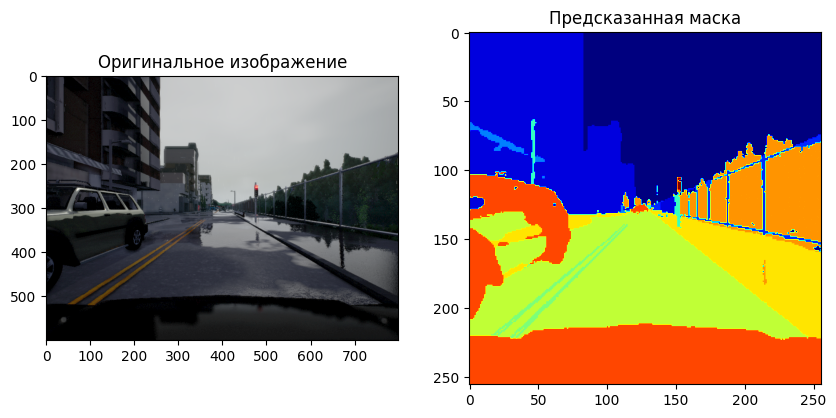

In [ ]:
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation
from PIL import Image
import torch
import matplotlib.pyplot as plt

# Шаг 1: Инициализация процессора и загрузка обученной модели
#best_checkpoint_dir = "/content/results/checkpoint-240"  # Укажите путь к лучшему чекпоинту
processor = SegformerImageProcessor.from_pretrained(best_checkpoint_dir)
model = SegformerForSemanticSegmentation.from_pretrained(best_checkpoint_dir)

# Шаг 2: Загрузка изображения
image_path = "/content/02_00_000.png"  # Укажите путь к изображению
image = Image.open(image_path).convert("RGB")  # Загрузка и преобразование в RGB, если необходимо

# Шаг 3: Предобработка изображения
inputs = processor(images=image, return_tensors="pt")

# Шаг 4: Прогон через модель для получения предсказания
with torch.no_grad():
    outputs = model(**inputs)
    logits = outputs.logits  # Получаем логиты (перед softmax/sigmoid)
    predicted_mask = torch.argmax(logits, dim=1).squeeze().cpu().numpy()  # Находим метку класса для каждого пикселя

# Шаг 5: Отображение результата
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Оригинальное изображение")

plt.subplot(1, 2, 2)
plt.imshow(predicted_mask, cmap="jet")  # Отображение маски в цветовой карте
plt.title("Предсказанная маска")
plt.show()


In [ ]:
# Используем np.unique() для получения уникальных значений
unique_values = np.unique(predicted_mask)

print(unique_values)
print(len(unique_values))
print(len(predicted_mask))

[ 0  1  2  3  5  6  7  8  9 10 12]
11
256


In [ ]:
!zip -r /content/checkpoint-1200.zip /content/results/checkpoint-1200

  adding: content/results/checkpoint-1200/ (stored 0%)
  adding: content/results/checkpoint-1200/optimizer.pt (deflated 7%)
  adding: content/results/checkpoint-1200/scheduler.pt (deflated 55%)
  adding: content/results/checkpoint-1200/trainer_state.json (deflated 82%)
  adding: content/results/checkpoint-1200/training_args.bin (deflated 51%)
  adding: content/results/checkpoint-1200/rng_state.pth (deflated 25%)
  adding: content/results/checkpoint-1200/model.safetensors (deflated 7%)
  adding: content/results/checkpoint-1200/preprocessor_config.json (deflated 46%)
  adding: content/results/checkpoint-1200/config.json (deflated 57%)


Класс Unlabeled:
  Precision: 0.9944
  Recall: 0.9846
  F1-score: 0.9895
  IoU: 0.9792
Класс Building:
  Precision: 0.9423
  Recall: 0.9574
  F1-score: 0.9498
  IoU: 0.9044
Класс Fence:
  Precision: 0.7471
  Recall: 0.4717
  F1-score: 0.5783
  IoU: 0.4068
Класс Other:
  Precision: 0.8151
  Recall: 0.5344
  F1-score: 0.6456
  IoU: 0.4766
Класс Pole:
  Precision: 0.5848
  Recall: 0.4373
  F1-score: 0.5004
  IoU: 0.3337
Класс Roadline:
  Precision: 0.8647
  Recall: 0.8474
  F1-score: 0.8560
  IoU: 0.7482
Класс Road:
  Precision: 0.8853
  Recall: 0.9860
  F1-score: 0.9329
  IoU: 0.8743
Класс Sidewalk:
  Precision: 0.8958
  Recall: 0.9810
  F1-score: 0.9364
  IoU: 0.8805
Класс Vegetation:
  Precision: 0.8865
  Recall: 0.9423
  F1-score: 0.9135
  IoU: 0.8408
Класс Car:
  Precision: 0.9655
  Recall: 0.8724
  F1-score: 0.9166
  IoU: 0.8461
Класс Wall:
  Precision: 0.0000
  Recall: 0.0000
  F1-score: 0.0000
  IoU: 0.0000
Класс Traffic sign:
  Precision: 0.9524
  Recall: 0.6040
  F1-score: 0.739

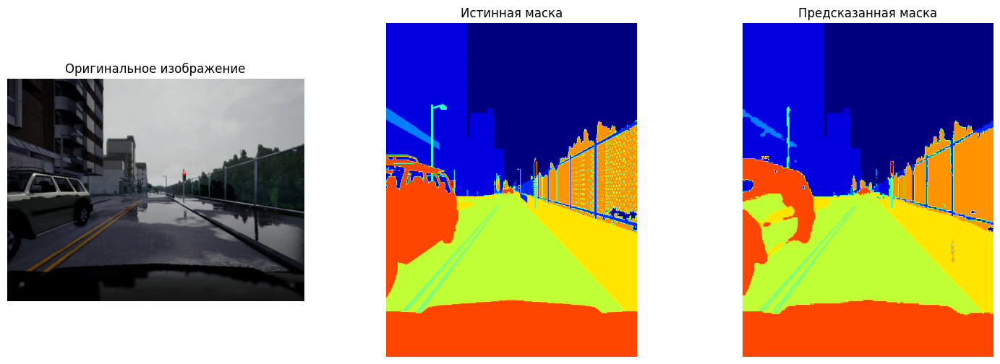

In [32]:
from PIL import Image
import numpy as np
import torch
from sklearn.metrics import precision_score, recall_score, f1_score, jaccard_score
import matplotlib.pyplot as plt

# Пути к файлам
true_mask_path = "/content/lyft_segmentation/segmentation_masks_processed/02_00_002.png"  # Путь к истинной маске
image_path = "/content/lyft_segmentation/images/02_00_002.png"  # Путь к исходному изображению

# Загрузка и подготовка изображения
original_image = Image.open(image_path).convert("RGB")
original_height, original_width = original_image.size  # Исходный размер изображения

# Загрузка истинной маски
true_mask = np.array(Image.open(true_mask_path).resize((original_width, original_height), resample=Image.NEAREST))

# Маска, предсказанная моделью SegFormer (в формате 256x256)
predicted_mask_256x256 = torch.argmax(logits, dim=1).squeeze().cpu().numpy()

# Преобразование предсказанной маски в PIL изображение и масштабирование до исходного размера
predicted_mask_img = Image.fromarray(predicted_mask_256x256.astype(np.uint8))
predicted_mask_resized = predicted_mask_img.resize((original_width, original_height), resample=Image.NEAREST)
predicted_mask_resized = np.array(predicted_mask_resized)

# Расчет метрик для каждого класса
unique_classes = np.unique(true_mask)

# Инициализация списков для метрик по каждому классу
precision_per_class = []
recall_per_class = []
f1_per_class = []
iou_per_class = []

for cls in unique_classes:
    # Создаем бинарные маски для текущего класса
    true_binary_mask = (true_mask == cls).flatten()
    pred_binary_mask = (predicted_mask_resized == cls).flatten()

    # Вычисляем метрики для текущего класса
    precision = precision_score(true_binary_mask, pred_binary_mask, zero_division=0)
    recall = recall_score(true_binary_mask, pred_binary_mask, zero_division=0)
    f1 = f1_score(true_binary_mask, pred_binary_mask, zero_division=0)
    iou = jaccard_score(true_binary_mask, pred_binary_mask, zero_division=0)

    # Сохраняем метрики
    precision_per_class.append(precision)
    recall_per_class.append(recall)
    f1_per_class.append(f1)
    iou_per_class.append(iou)

    # Выводим метрики для текущего класса
    class_name = id2label.get(cls)
    print(f"Класс {class_name}:")
    print(f"  Precision: {precision:.4f}")
    print(f"  Recall: {recall:.4f}")
    print(f"  F1-score: {f1:.4f}")
    print(f"  IoU: {iou:.4f}")

# Выводим средние метрики
print("\nСредние метрики:")
print(f"Mean Precision: {np.mean(precision_per_class):.4f}")
print(f"Mean Recall: {np.mean(recall_per_class):.4f}")
print(f"Mean F1-score: {np.mean(f1_per_class):.4f}")
print(f"Mean IoU: {np.mean(iou_per_class):.4f}")

# Отображение изображений и масок
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))
ax1.imshow(original_image)
ax1.set_title("Оригинальное изображение")
ax1.axis("off")

ax2.imshow(true_mask, cmap="jet")
ax2.set_title("Истинная маска")
ax2.axis("off")

ax3.imshow(predicted_mask_resized, cmap="jet")
ax3.set_title("Предсказанная маска")
ax3.axis("off")

plt.show()

-------------------------------------------------------------------------------------

In [ ]:
from transformers import TrainingArguments

# Параметры обучения
epochs = 20
lr = 0.00006
batch_size = 4

training_args = TrainingArguments(
    output_dir="./results",  # Папка для сохранения результатов (моделей, логов)
    learning_rate=lr,  # Устанавливаем скорость обучения
    num_train_epochs=epochs,  # Число эпох
    per_device_train_batch_size=batch_size,  # Размер батча для тренировки
    per_device_eval_batch_size=batch_size,  # Размер батча для валидации
    save_total_limit=6,  # Ограничение на количество сохраненных моделей
    evaluation_strategy="steps",  # Оценка на каждом шаге
    save_strategy="steps",  # Сохранение на каждом шаге
    save_steps=100,  # Сохраняем модель каждые 20 шагов
    eval_steps=20,  # Оценка на каждом шаге
    logging_steps=1,  # Логируем информацию на каждом шаге
    eval_accumulation_steps=5,  # Суммируем градиенты для нескольких шагов
    load_best_model_at_end=True,  # Загружаем лучшую модель в конце
    remove_unused_columns=False,  # Оставляем все колонки (важно для кастомных данных)
    report_to="none",  # Отключаем отчетность в wandb
    run_name="segformer_experiment",  # Имя для конкретного запуска
    gradient_accumulation_steps=2,  # Умножаем количество шагов для аккумуляции
)

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1568: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [ ]:
from transformers import SegformerForSemanticSegmentation
pretrained_model_name = "nvidia/segformer-b5-finetuned-cityscapes-1024-1024"

model = SegformerForSemanticSegmentation.from_pretrained(
    pretrained_model_name,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True
)
model.to(device)
print()

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-cityscapes-1024-1024 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([19, 768, 1, 1]) in the checkpoint and torch.Size([13, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([19]) in the checkpoint and torch.Size([13]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_ds,
    eval_dataset=test_ds,
    compute_metrics=compute_metrics,
)

In [ ]:
torch.cuda.empty_cache()

In [ ]:
trainer.train()

OutOfMemoryError: CUDA out of memory. Tried to allocate 64.00 MiB. GPU 0 has a total capacity of 14.75 GiB of which 9.06 MiB is free. Process 6927 has 14.74 GiB memory in use. Of the allocated memory 14.58 GiB is allocated by PyTorch, and 24.05 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

----------------------------------------------------------

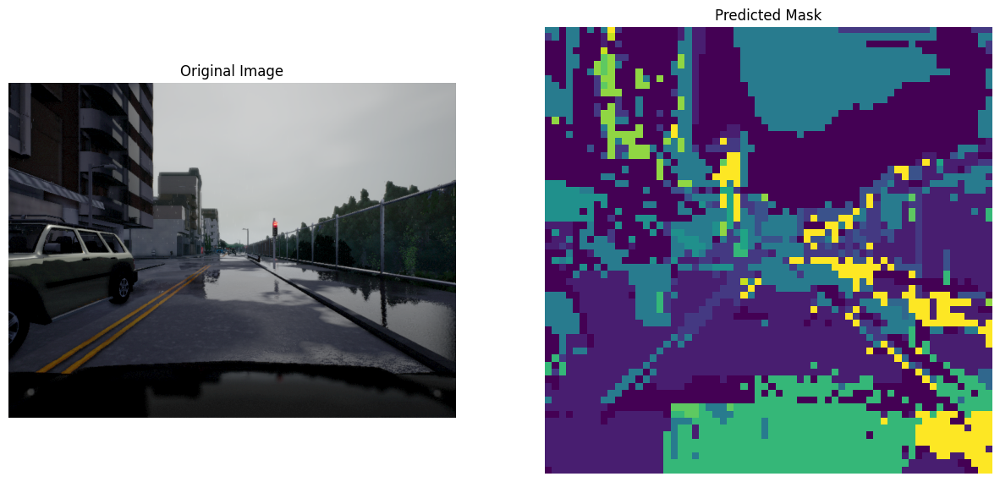

In [ ]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

# Путь к изображению
image_path = '/content/02_00_000.png'

# Загрузим изображение
image = Image.open(image_path).convert("RGB")

# Преобразования для подачи в модель (включая нормализацию и изменение размера, если нужно)
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Пример изменения размера
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Пример нормализации
])

# Применим преобразования к изображению
input_tensor = transform(image).unsqueeze(0)  # Добавляем batch dimension

# Перемещаем изображение на GPU, если оно доступно
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_tensor = input_tensor.to(device)

# Загрузка модели (предполагаем, что она уже обучена и сохранена)
model.eval()  # Переводим модель в режим оценки

# Получение предсказания
with torch.no_grad():
    output = model(input_tensor)
    predicted_mask = torch.argmax(output.logits, dim=1).cpu().numpy()  # Извлекаем маску

# Отображаем изображение и маску
fig, axs = plt.subplots(1, 2, figsize=(15, 7))

# Оригинальное изображение
axs[0].imshow(image)
axs[0].set_title("Original Image")
axs[0].axis('off')

# Предсказанная маска
axs[1].imshow(predicted_mask[0], cmap='viridis')  # Предсказанная маска
axs[1].set_title("Predicted Mask")
axs[1].axis('off')

plt.show()
